1. ``micromamba create -n 2025biml python=3.10 pip jupyter``  
2. ``micromamba activate 2025biml``  
3. ``python -m ipykernel install --user --name=2025biml``  
4. ``pip install "spatialdata[extra]"``  

- https://spatialdata.scverse.org/en/stable/tutorials/notebooks/notebooks.html   

# Loading the data

In [2]:
!wget https://nc.pnucolab.com/s/BS8Wjwfp9AKopg6/download/visiumhd_sdata_cropped.zarr.tar.gz
!tar -xzvf visiumhd_sdata_cropped.zarr.tar.gz

--2025-02-24 14:37:43--  https://nc.pnucolab.com/s/BS8Wjwfp9AKopg6/download/visiumhd_sdata_cropped.zarr.tar.gz
Resolving nc.pnucolab.com (nc.pnucolab.com)... 164.125.255.244
Connecting to nc.pnucolab.com (nc.pnucolab.com)|164.125.255.244|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/gzip]
Saving to: ‘visiumhd_sdata_cropped.zarr.tar.gz’

visiumhd_sdata_crop     [       <=>          ] 135.21M   108MB/s    in 1.2s    

2025-02-24 14:37:45 (108 MB/s) - ‘visiumhd_sdata_cropped.zarr.tar.gz’ saved [141782811]

visiumhd_sdata_cropped.zarr/
visiumhd_sdata_cropped.zarr/.zgroup
visiumhd_sdata_cropped.zarr/images/
visiumhd_sdata_cropped.zarr/images/.zgroup
visiumhd_sdata_cropped.zarr/images/Visium_HD_Human_Colon_Cancer_P1_full_image/
visiumhd_sdata_cropped.zarr/images/Visium_HD_Human_Colon_Cancer_P1_full_image/.zgroup
visiumhd_sdata_cropped.zarr/images/Visium_HD_Human_Colon_Cancer_P1_full_image/0/
visiumhd_sdata_cropped.zarr/images/Visium_HD_Hum

In [ ]:
%%time
import spatialdata as sd

"""
import spatialdata_io

sdata = spatialdata_io.visium_hd(path="/path/to/VisiumHD output directory",
                                 fullres_image_file="/path/to/full-resolution image file",
                                 load_all_images=True
                                 )
"""

sdata = sd.read_zarr("visiumhd_sdata_cropped.zarr")
sdata

/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_val

CPU times: user 10.8 s, sys: 4.86 s, total: 15.6 s
Wall time: 32.9 s


SpatialData object, with associated Zarr store: /bce/groups/pnucolab/analysis/BIML2025/notebook_final/visiumhd_sdata_cropped.zarr
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_cytassist_image': DataArray[cyx] (3, 297, 297)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_full_image': DataTree[cyx] (3, 5000, 5000), (3, 2500, 2500), (3, 1250, 1250), (3, 625, 625), (3, 313, 313)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (469860, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (29621, 1) (2D shapes)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (7485, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (469860, 18085)
      ├── 'square_008um': AnnData (29621, 18085)
      └── 'square_016um': AnnData (7485, 18085)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        Visium_HD_Human_Colon_Cancer_P1_square_002um (Shapes), Visium_HD_Human_Co

In [4]:
# let's make the var names unique; this improves performance in accessing the tabular data and is necessary to be able to plot the data
for table in sdata.tables.values():
    table.var_names_make_unique()

# Plotting the images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


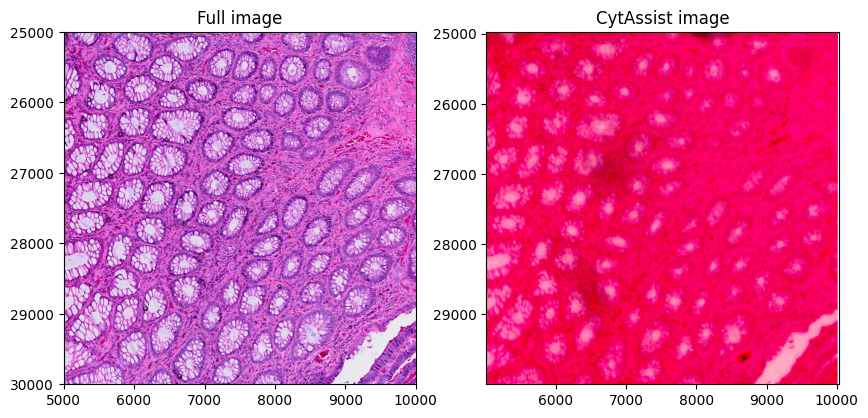

In [6]:
import matplotlib.pyplot as plt
import spatialdata_plot

axes = plt.subplots(1, 2, figsize=(10, 5))[1].flatten()
sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.show(ax=axes[0], coordinate_systems="global", title="Full image")
sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_cytassist_image").pl.show(ax=axes[1], coordinate_systems="global", title="CytAssist image")

# Plotting the gene expression data

## Plotting the vector geometries

INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   


/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      
CPU times: user 5.59 s, sys: 277 ms, total: 5.87 s
Wall time: 9.26 s


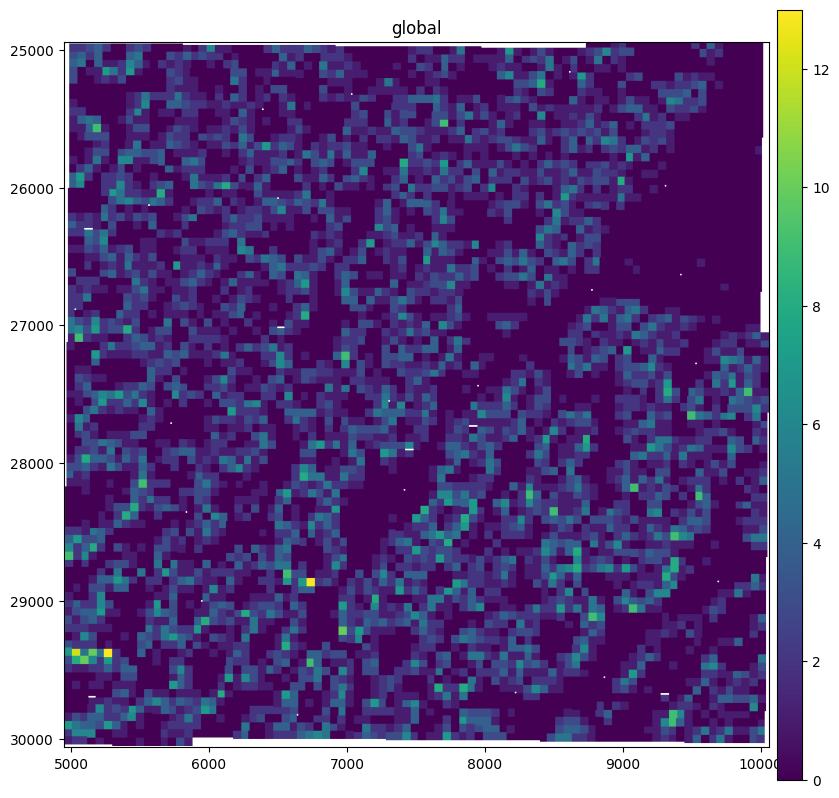

In [12]:
%%time
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name = "EPCAM"
sdata.pl.render_shapes("Visium_HD_Human_Colon_Cancer_P1_square_016um", color=gene_name, method="datashader").pl.show(
    coordinate_systems="global", ax=ax
)

## Performant on-the-fly data rasterization

In [13]:
%%time
from spatialdata import rasterize_bins

for bin_size in ["016", "008", "002"]:
    # rasterize_bins() requires a compresed sparse column (csc) matrix
    sdata.tables[f"square_{bin_size}um"].X = sdata.tables[f"square_{bin_size}um"].X.tocsc()
    rasterized = rasterize_bins(
        sdata,
        f"Visium_HD_Human_Colon_Cancer_P1_square_{bin_size}um",
        f"square_{bin_size}um",
        "array_col",
        "array_row",
    )
    sdata[f"rasterized_{bin_size}um"] = rasterized

/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:71: UserWarning: Key `rasterized_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:71: UserWarning: Key `rasterized_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


CPU times: user 953 ms, sys: 658 ms, total: 1.61 s
Wall time: 877 ms


/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:71: UserWarning: Key `rasterized_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


In [14]:
%%time
# this is very fast
sdata["rasterized_002um"].sel(c=gene_name).compute()
# this must not be called
# sdata["rasterized_002um"].compute()

CPU times: user 34.8 ms, sys: 3.79 ms, total: 38.6 ms
Wall time: 36.6 ms


<xarray.DataArray 'image' (y: 692, x: 692)> Size: 2MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Coordinates:
    c        <U5 20B 'EPCAM'
  * y        (y) float64 6kB 0.5 1.5 2.5 3.5 4.5 ... 688.5 689.5 690.5 691.5
  * x        (x) float64 6kB 0.5 1.5 2.5 3.5 4.5 ... 688.5 689.5 690.5 691.5
Attributes:
    transform:  {'global': Sequence \n    Sequence \n        Affine (x, y -> ...

CPU times: user 317 ms, sys: 3.36 ms, total: 321 ms
Wall time: 315 ms


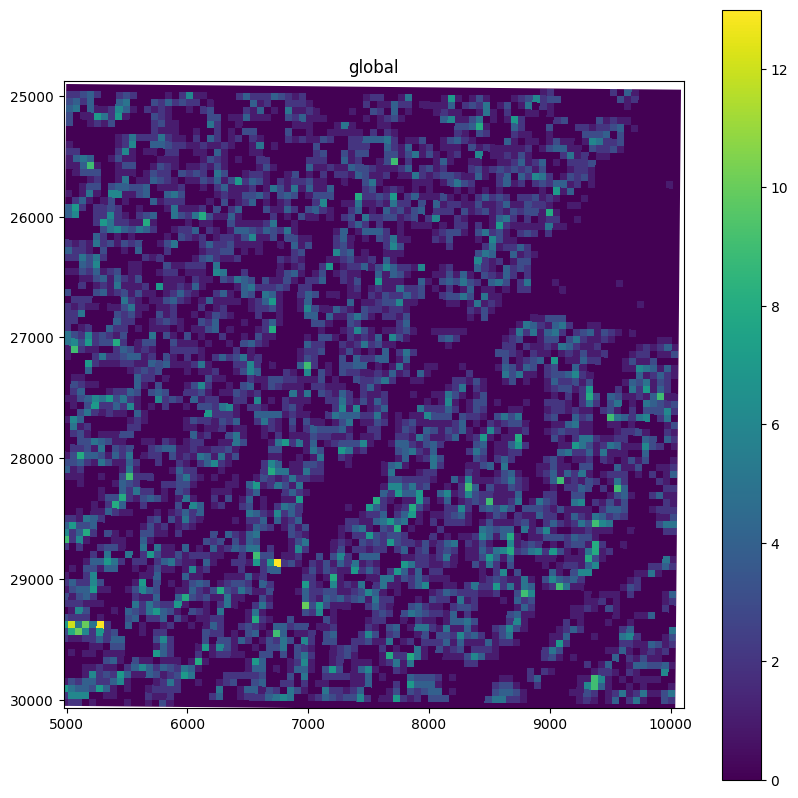

In [15]:
%%time
plt.figure(figsize=(10, 10))
ax = plt.gca()

sdata.pl.render_images("rasterized_016um", channel=gene_name, scale="full").pl.show(coordinate_systems="global", ax=ax)

## Plotting subsets of the data

In [16]:
from spatialdata import bounding_box_query

sdata_small = sdata.query.bounding_box(
    min_coordinate=[6000, 27000], max_coordinate=[8000, 29000], axes=("x", "y"), target_coordinate_system="global"
)
sdata_small

SpatialData object
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_cytassist_image': DataArray[cyx] (3, 118, 118)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_full_image': DataTree[cyx] (3, 2000, 2000), (3, 1000, 1000), (3, 500, 500), (3, 250, 250), (3, 125, 125)
│     ├── 'rasterized_002um': DataArray[cyx] (18085, 276, 276)
│     ├── 'rasterized_008um': DataArray[cyx] (18085, 69, 69)
│     └── 'rasterized_016um': DataArray[cyx] (18085, 34, 35)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (75515, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (4818, 1) (2D shapes)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (1235, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (75515, 18085)
      ├── 'square_008um': AnnData (4818, 18085)
      └── 'square_016um': AnnData (1235, 18085)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        raste

/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


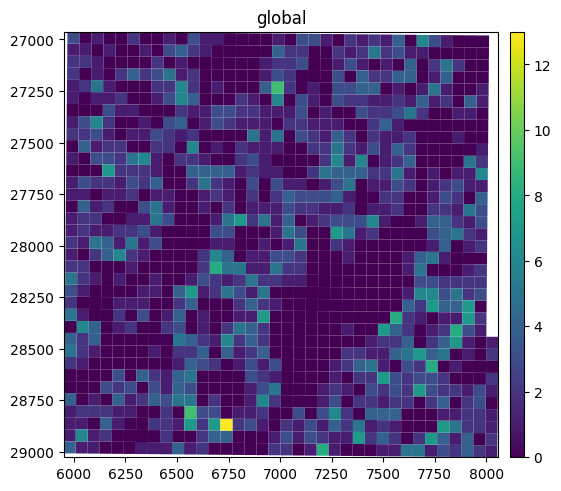

In [17]:
sdata_small.pl.render_shapes("Visium_HD_Human_Colon_Cancer_P1_square_016um", color=gene_name).pl.show(
    coordinate_systems="global"
)

You can see the __moiré pattern__, and the __gaps__ between the bins.  
This is due to the fact that the grid is not axis-aligned but presents a small rotation.  
A solution is to switch to `datashader` as a backend (which is enabled by default when the number of geometries is large).

INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


/usr/local/lib/python3.11/dist-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/usr/local/lib/python3.11/dist-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


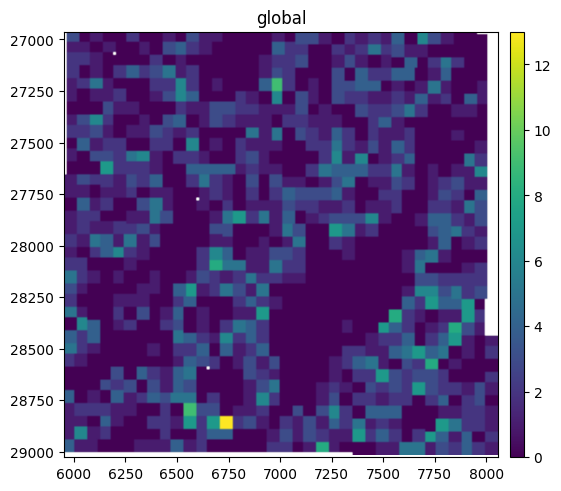

In [66]:
gene_name = "EPCAM"
sdata_small.pl.render_shapes(
    "Visium_HD_Human_Colon_Cancer_P1_square_016um", color=gene_name, method="datashader"
).pl.show(coordinate_systems="global")

INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   


/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      
INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   


/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


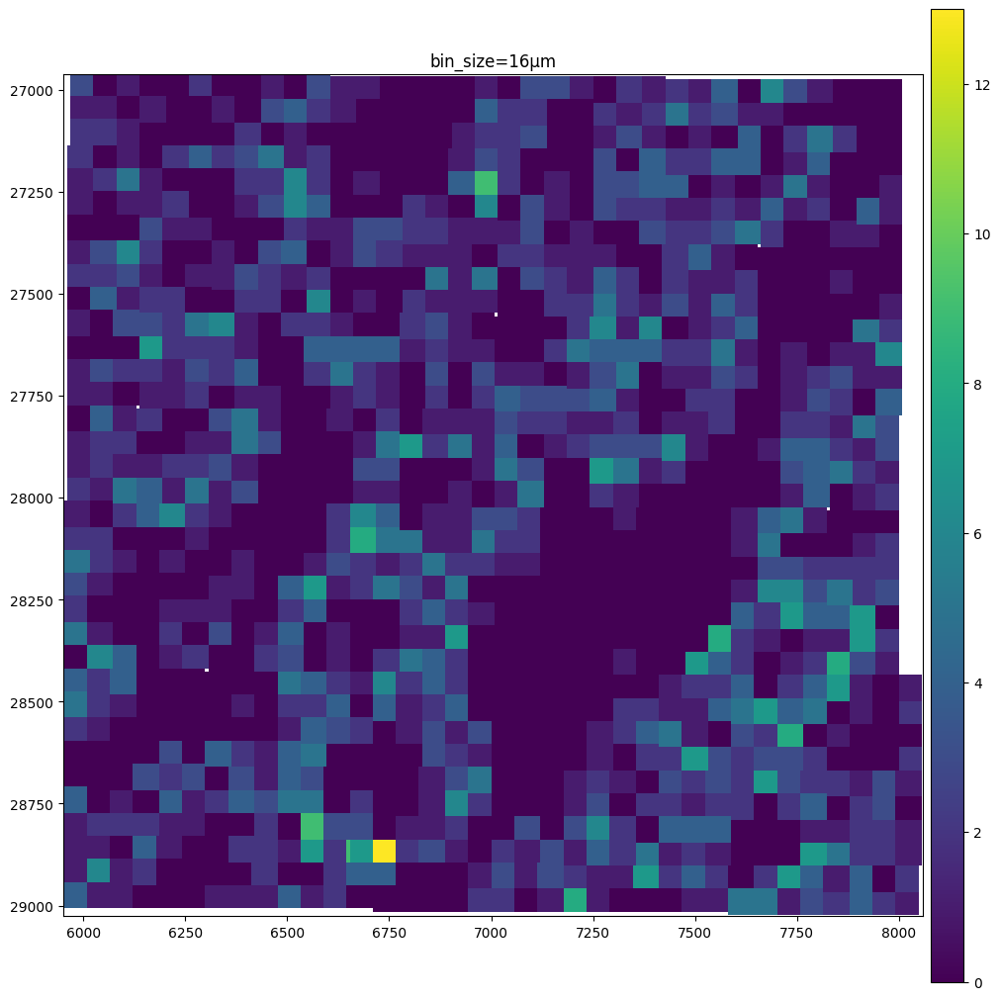

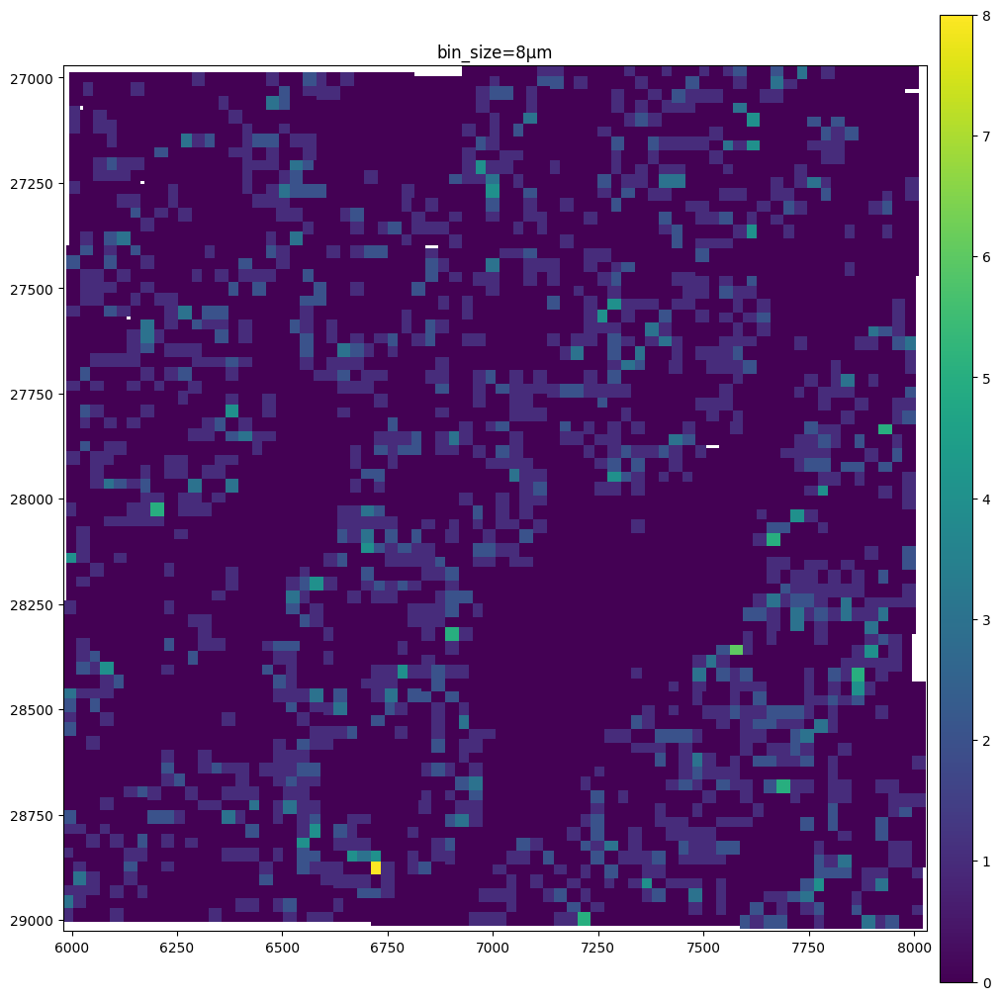

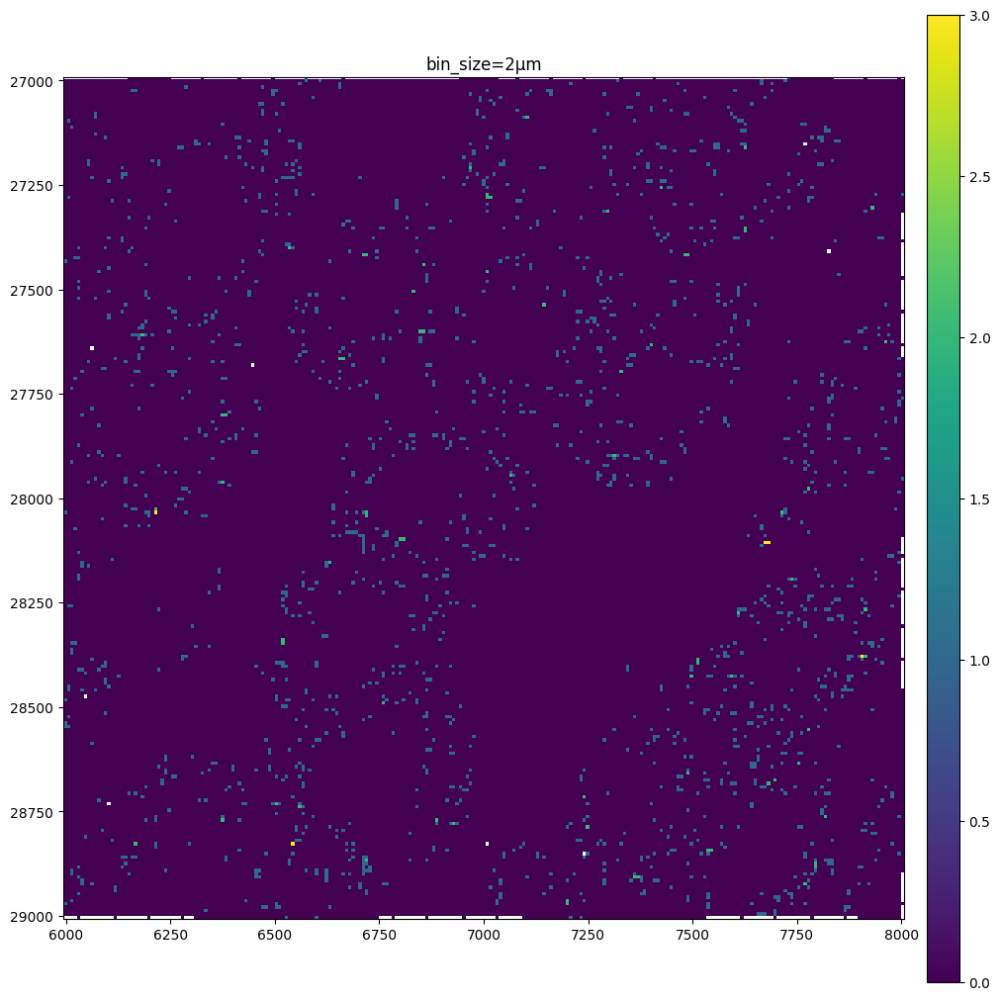

In [18]:
for bin_size in [16, 8, 2]:
    sdata_small.pl.render_shapes(
        f"Visium_HD_Human_Colon_Cancer_P1_square_{bin_size:03}um",
        color=gene_name,
        method="datashader",
    ).pl.show(coordinate_systems="global", title=f"bin_size={bin_size}µm", figsize=(10, 10))

The data present a lot of sparsity.  
Let’s remake the plots above by visualizing only the non-zero entries and using the full-resolution image as a background.

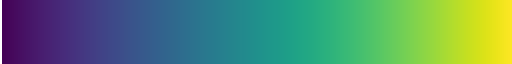

In [19]:
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent

# let's display the areas where no expression is detected as transparent
new_cmap = set_zero_in_cmap_to_transparent(cmap="viridis")
new_cmap

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_008um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/

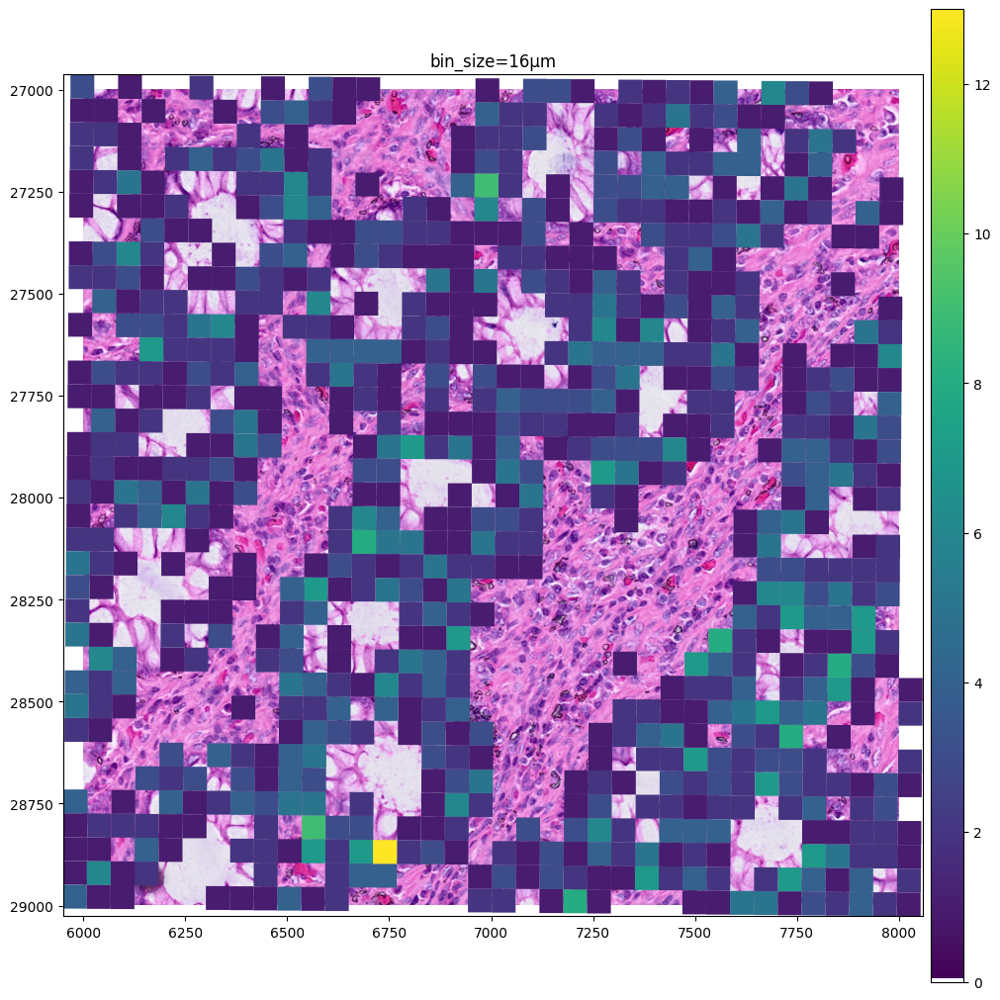

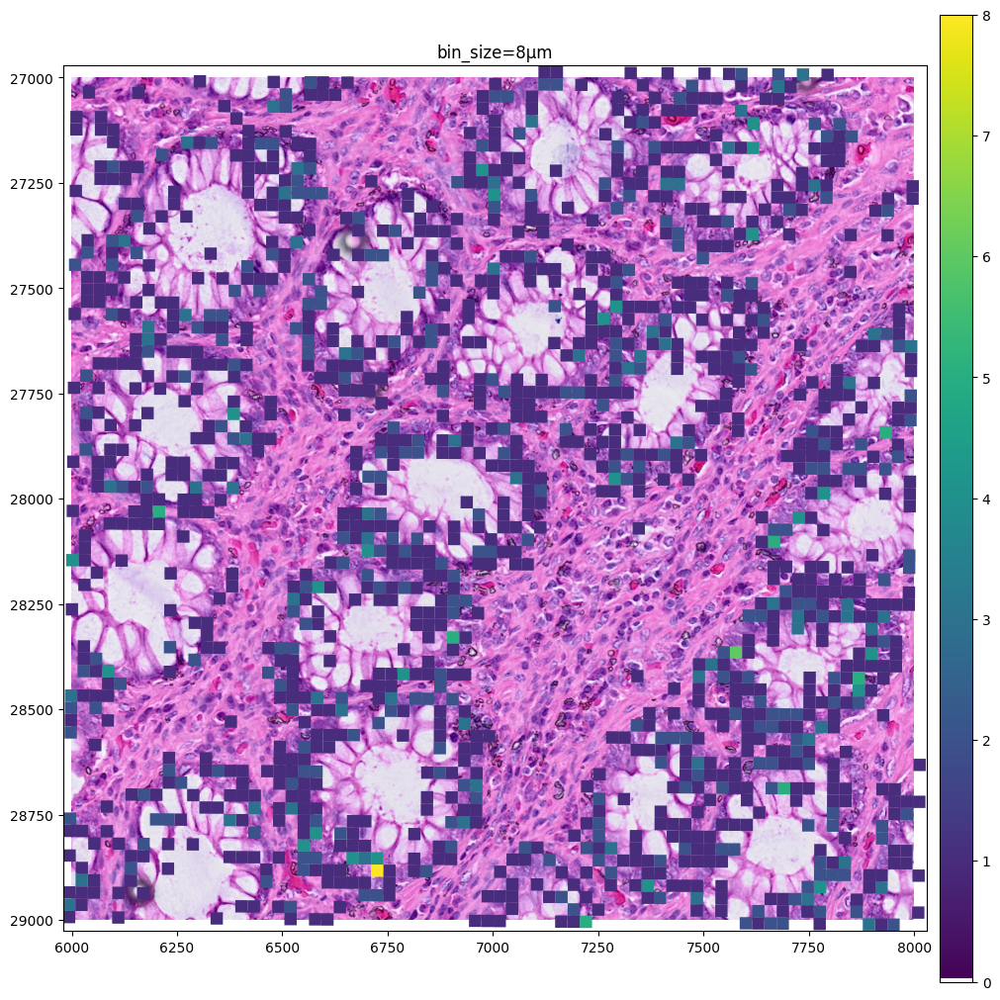

In [20]:
for bin_size in [16, 8]:
    sdata_small.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
        f"Visium_HD_Human_Colon_Cancer_P1_square_{bin_size:03}um", color=gene_name, cmap=new_cmap
    ).pl.show(coordinate_systems="global", title=f"bin_size={bin_size}µm", figsize=(10, 10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


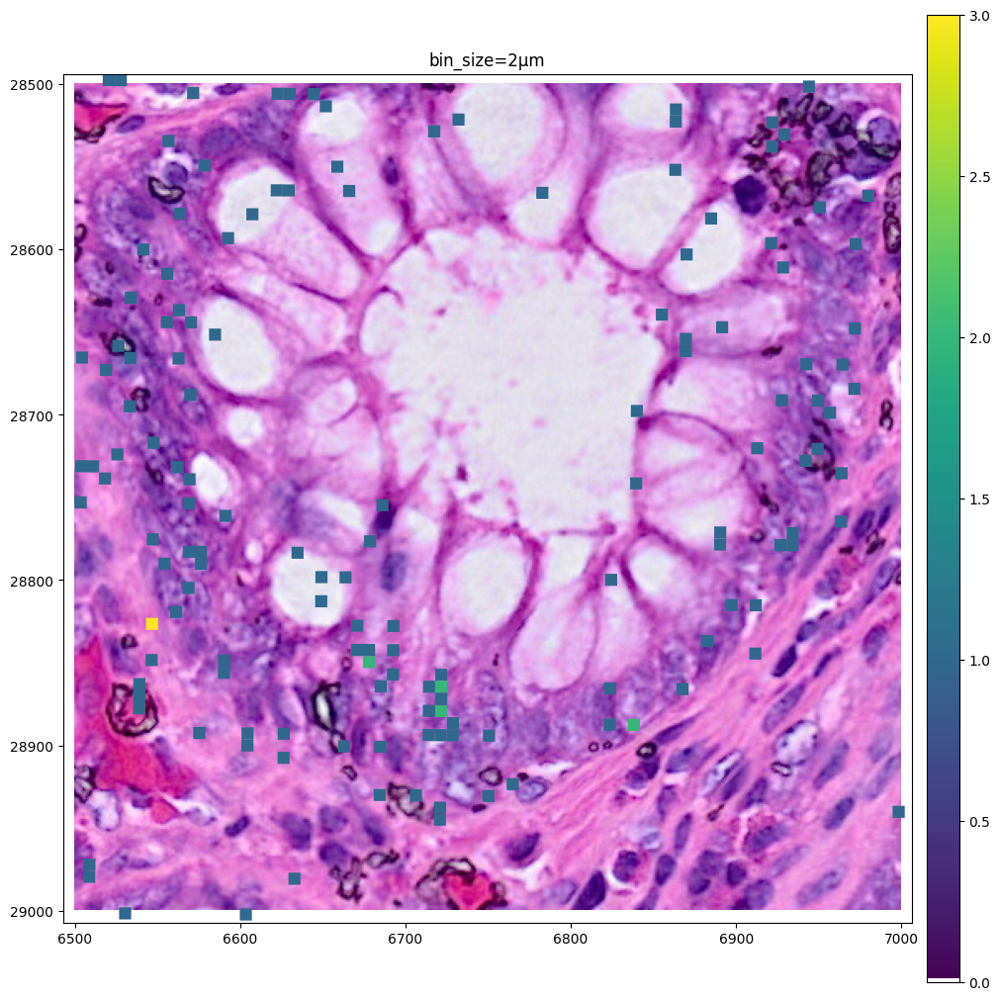

In [21]:
crop1 = lambda x: bounding_box_query(
    x, min_coordinate=[6500, 28500], max_coordinate=[7000,29000], axes=("x", "y"), target_coordinate_system="global"
)
crop1(sdata_small).pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "Visium_HD_Human_Colon_Cancer_P1_square_002um", color=gene_name, cmap=new_cmap, method="matplotlib"
).pl.show(coordinate_systems="global", title=f"bin_size=2µm", figsize=(10, 10))

# Plotting clusters

Let’s now color the 16µm bins by cluster identity.  
Let’s reuse the clusters `gene_expression_graphclust` computed from 10x Genomics and available with the raw data from the 10x Genomics website.

In [27]:
import os
from tempfile import TemporaryDirectory

import pandas as pd
import requests

# For convenience we rehost the single file containing the clusters we are interested in.
# Let's download it in a temporary directory and read it in a pandas DataFrame. The file is 2 MB.
clusters_file_url = "https://nc.pnucolab.com/s/etWMAbbdHtZJf9D/download/visiumhd_sdata_cropped_clusters.csv"

with TemporaryDirectory() as tmpdir:
    path = os.path.join(tmpdir, "data.csv")
    response = requests.get(clusters_file_url)
    with open(path, "wb") as f:
        f.write(response.content)
    df = pd.read_csv(path)

In [28]:
df.head(5)

,Barcode,Cluster
0,s_016um_00052_00082-1,3
1,s_016um_00010_00367-1,5
2,s_016um_00163_00399-1,2
3,s_016um_00238_00388-1,4
4,s_016um_00144_00175-1,1


In [29]:
# let's convert the Cluster dtype from int64 to categorical since later we want the plots to use a categorical colormap
df["Cluster"] = df["Cluster"].astype("category")
df.set_index("Barcode", inplace=True)

In [31]:
sdata["square_016um"].obs.head(5)

,in_tissue,array_row,array_col,location_id,region
s_016um_00191_00159-1,1,191,159,25,Visium_HD_Human_Colon_Cancer_P1_square_016um
s_016um_00159_00107-1,1,159,107,47,Visium_HD_Human_Colon_Cancer_P1_square_016um
s_016um_00135_00089-1,1,135,89,68,Visium_HD_Human_Colon_Cancer_P1_square_016um
s_016um_00173_00166-1,1,173,166,158,Visium_HD_Human_Colon_Cancer_P1_square_016um
s_016um_00125_00156-1,1,125,156,265,Visium_HD_Human_Colon_Cancer_P1_square_016um


In [32]:
sdata["square_016um"].obs["Cluster"] = df["Cluster"]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata_plot/pl/utils.py:771: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


CPU times: user 4.13 s, sys: 319 ms, total: 4.45 s
Wall time: 4.4 s


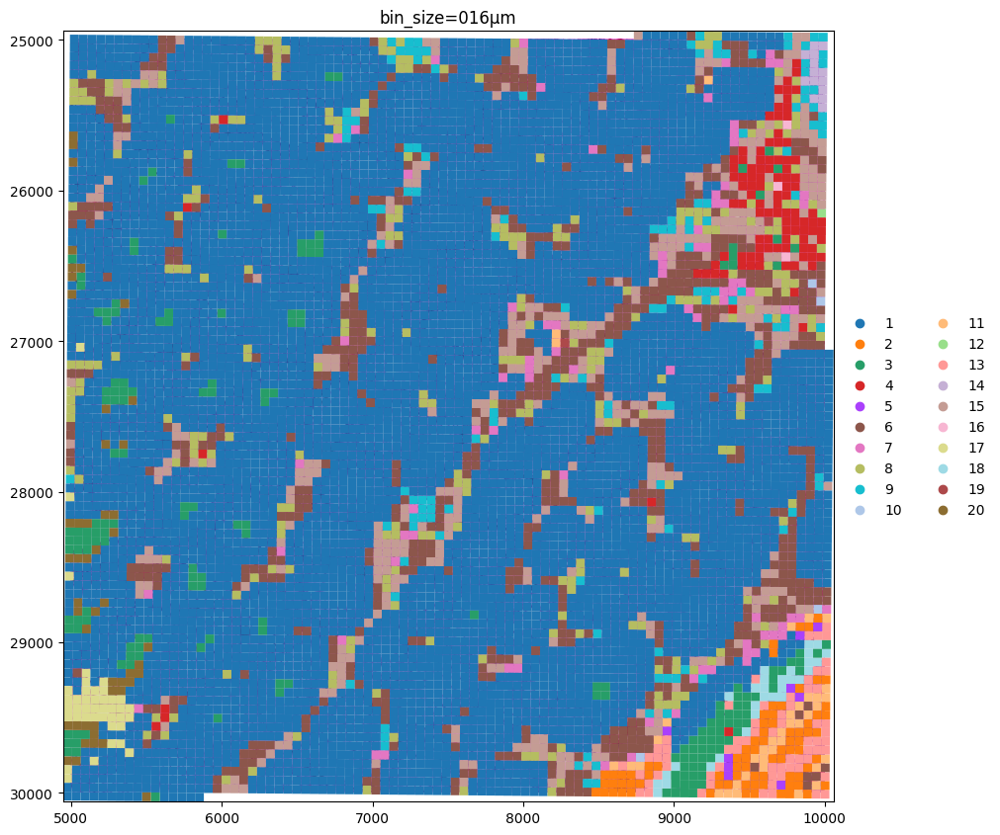

In [131]:
%%time
sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "Visium_HD_Human_Colon_Cancer_P1_square_016um", color="Cluster"
).pl.show(coordinate_systems="global", title=f"bin_size=016µm", figsize=(10, 10))

In [35]:
sdata

SpatialData object, with associated Zarr store: /bce/groups/pnucolab/analysis/BIML2025/notebook_final/visiumhd_sdata_cropped.zarr
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_cytassist_image': DataArray[cyx] (3, 297, 297)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_full_image': DataTree[cyx] (3, 5000, 5000), (3, 2500, 2500), (3, 1250, 1250), (3, 625, 625), (3, 313, 313)
│     ├── 'rasterized_002um': DataArray[cyx] (18085, 692, 692)
│     ├── 'rasterized_008um': DataArray[cyx] (18085, 174, 173)
│     └── 'rasterized_016um': DataArray[cyx] (18085, 88, 87)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (469860, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (29621, 1) (2D shapes)
│     └── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (7485, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (469860, 18085)
      ├── 'square_008um': AnnData (29621, 18085)
      └─

# Saving the data

In [39]:
sdata.write("./visiumhd_sdata_cropped2.zarr")

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside visiumhd_sdata_cropped2.zarr). Please see the documentation of `is_self_contained()` to 
         understand the implications of working with SpatialData objects that are not self-contained.              
INFO     The Zarr backing store has been changed from visiumhd_sdata_cropped.zarr the new file path:               
         visiumhd_sdata_cropped2.zarr                                                                              


# After napari

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Polygon

df = pd.read_csv("Shapes.csv")

polygons = df.sort_values('vertex-index').groupby('index').apply(
    lambda group: Polygon(zip(group['axis-1'], group['axis-0']))
)

gdf = gpd.GeoDataFrame(polygons, columns=['geometry']).reset_index()

gdf = gdf.set_index('index')
gdf.index.name = None  # 인덱스 이름 제거

print(gdf)

                                            geometry
0  POLYGON ((6556.434 28214.062, 6542.317 28225.6...
1  POLYGON ((6584.403 28525.072, 6571.911 28533.3...
2  POLYGON ((7010.29 28945.69, 7004.378 28964.268...


/tmp/ipykernel_314944/4105030614.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  polygons = df.sort_values('vertex-index').groupby('index').apply(


In [134]:
sdata.shapes['boundaries_from_napari'] = ShapesModel.parse(gdf)

In [135]:
sdata

SpatialData object, with associated Zarr store: /bce/groups/pnucolab/analysis/BIML2025/notebook_final/visiumhd_sdata_cropped2.zarr
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_cytassist_image': DataArray[cyx] (3, 297, 297)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_full_image': DataTree[cyx] (3, 5000, 5000), (3, 2500, 2500), (3, 1250, 1250), (3, 625, 625), (3, 313, 313)
│     ├── 'rasterized_002um': DataArray[cyx] (18085, 692, 692)
│     ├── 'rasterized_008um': DataArray[cyx] (18085, 174, 173)
│     └── 'rasterized_016um': DataArray[cyx] (18085, 88, 87)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (469860, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (29621, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (7485, 1) (2D shapes)
│     └── 'boundaries_from_napari': GeoDataFrame shape: (3, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnDa

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Dropping coordinate system 'downscaled_lowres' since it doesn't have relevant elements.                   
INFO     Dropping coordinate system 'downscaled_hires' since it doesn't have relevant elements.                    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


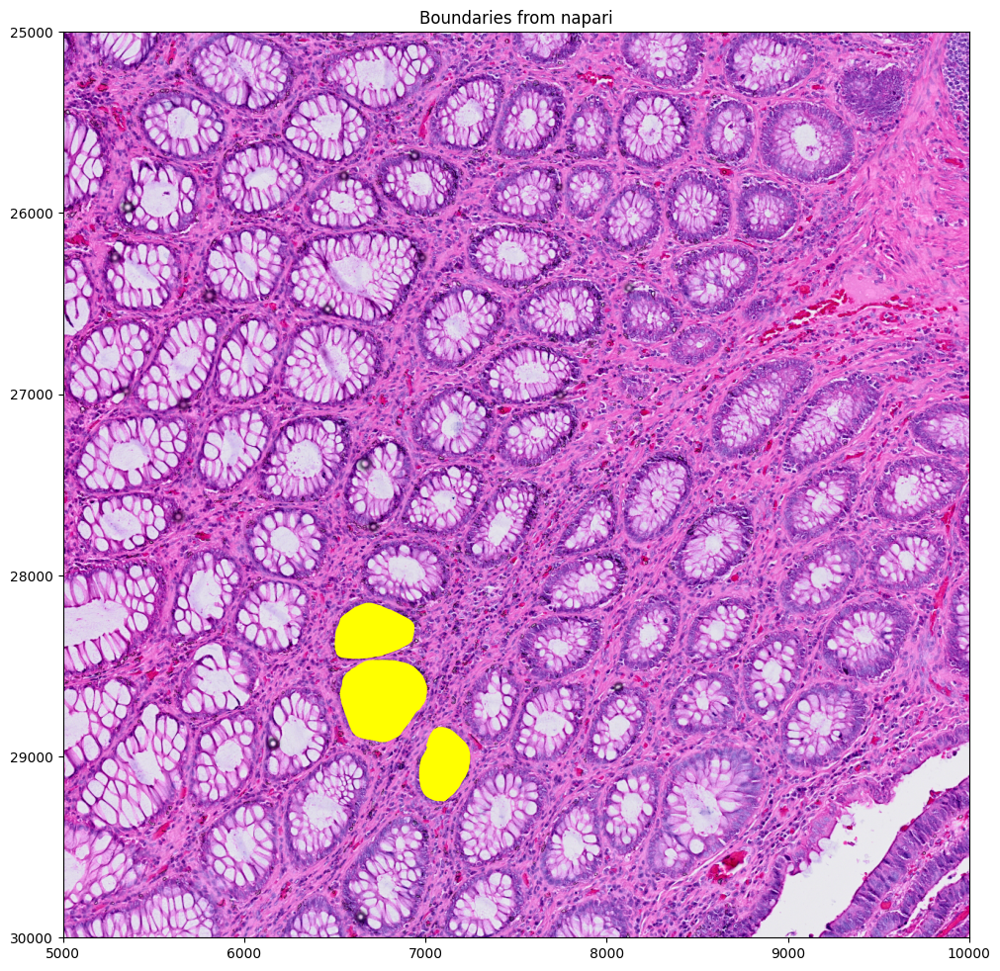

In [138]:
sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "boundaries_from_napari", color='#FFFF00'
).pl.show( title="Boundaries from napari", figsize=(10, 10))

## Polygon query

In [146]:
from spatialdata import polygon_query

queried_sdata = polygon_query(
    sdata,
    polygon=sdata['boundaries_from_napari']['geometry'][0],
    target_coordinate_system="global",
)
queried_sdata

SpatialData object
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_cytassist_image': DataArray[cyx] (3, 18, 26)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_full_image': DataTree[cyx] (3, 309, 440), (3, 154, 220), (3, 77, 110), (3, 39, 56), (3, 20, 27)
│     ├── 'rasterized_002um': DataArray[cyx] (18085, 43, 60)
│     ├── 'rasterized_008um': DataArray[cyx] (18085, 11, 15)
│     └── 'rasterized_016um': DataArray[cyx] (18085, 5, 7)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_002um': GeoDataFrame shape: (2043, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_008um': GeoDataFrame shape: (149, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Cancer_P1_square_016um': GeoDataFrame shape: (43, 1) (2D shapes)
│     └── 'boundaries_from_napari': GeoDataFrame shape: (1, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (2043, 18085)
      ├── 'square_008um': AnnData (149, 18085)
      └── 'square_016um': AnnData (43, 18085)
with coordinate systems:
  

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Dropping coordinate system 'downscaled_lowres' since it doesn't have relevant elements.                   
INFO     Dropping coordinate system 'downscaled_hires' since it doesn't have relevant elements.                    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


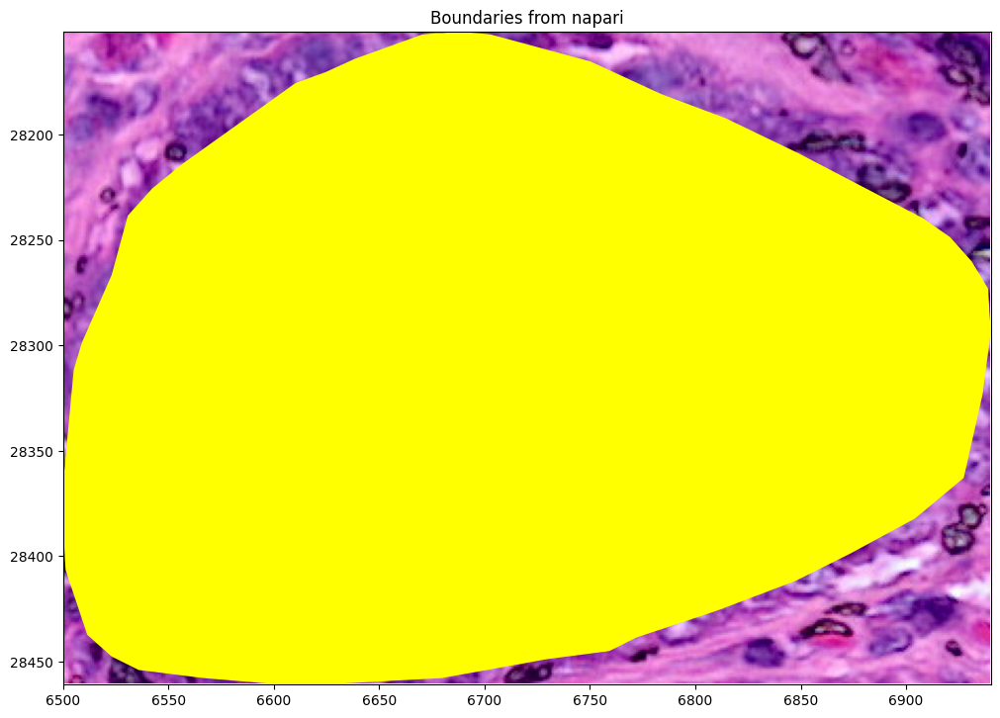

In [147]:
queried_sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "boundaries_from_napari", color='#FFFF00'
).pl.show( title="Boundaries from napari", figsize=(10, 10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


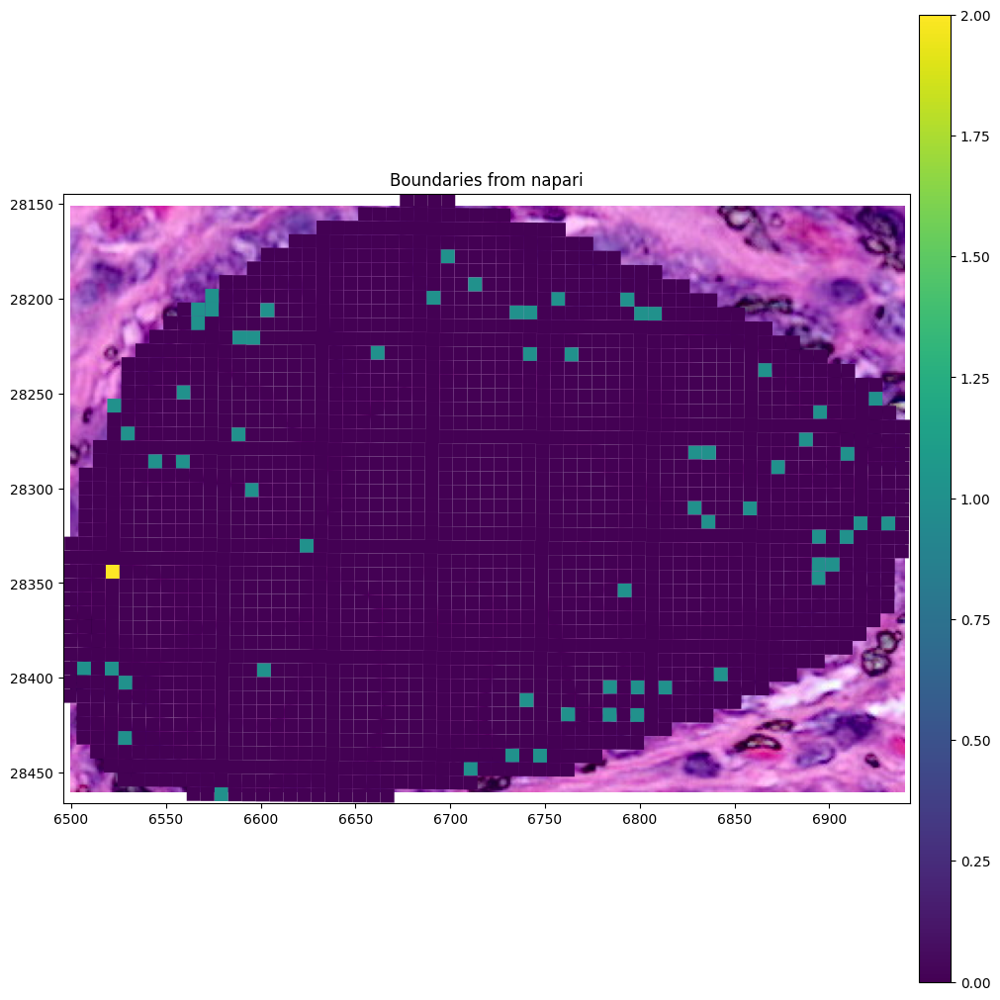

In [ ]:
queried_sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "Visium_HD_Human_Colon_Cancer_P1_square_002um", color='EPCAM'
).pl.show(coordinate_systems='global', title="Boundaries from napari", figsize=(10, 10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `Visium_HD_Human_Colon_Cancer_P1_square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/home/baejs/micromamba/envs/2025biml/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `square_002um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


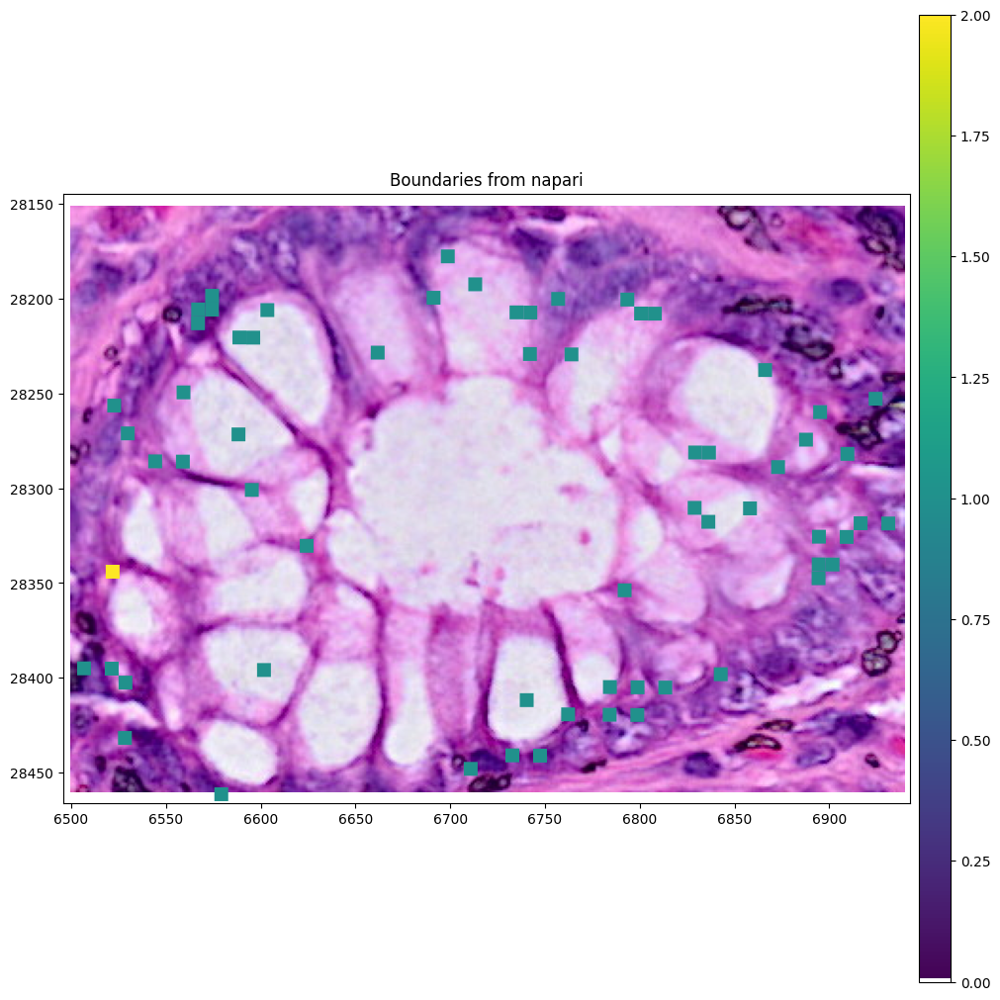

In [152]:
queried_sdata.pl.render_images("Visium_HD_Human_Colon_Cancer_P1_full_image").pl.render_shapes(
    "Visium_HD_Human_Colon_Cancer_P1_square_002um", color='EPCAM', cmap=new_cmap
).pl.show(coordinate_systems='global', title="Boundaries from napari", figsize=(10, 10))